<a href="https://colab.research.google.com/github/diegochaux/Diego/blob/main/TRABAJO_CLASE_Z.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Descargue 10 segundos de la canción de su preferencia desde youtube, y generé un filtro pasabanda (el usuario debe poder definir las frecuencias de corte) para cada uno de los filtros descritos (el usuario también debe poder fijar los parámetros de diseño de cada filtro). Compare los resultados de los filtros estudiados en este cuaderno tipo IIR para diseño Butterworth, Chebyshev 1, Chebyshev 2, Bessel y Elíptico.

In [1]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 21.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 40.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.5/162.5 kB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.6/104.6 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 63.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.1/142.1 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.5/61.5 kB 7.4 MB/s eta 0:00:00
  Created wh

In [2]:
link="https://www.youtube.com/watch?v=TXGbhniTBrU"
!yt-dlp --extract-audio -o "audio" --audio-format mp3 {link}

[youtube] Extracting URL: https://www.youtube.com/watch?v=TXGbhniTBrU
[youtube] TXGbhniTBrU: Downloading webpage
[youtube] TXGbhniTBrU: Downloading ios player API JSON
[youtube] TXGbhniTBrU: Downloading android player API JSON
[youtube] TXGbhniTBrU: Downloading player 63e90c30
[youtube] TXGbhniTBrU: Downloading m3u8 information
[info] TXGbhniTBrU: Downloading 1 format(s): 251
[download] Destination: audio
[download] 100% of    1.87MiB in 00:00:00 at 15.13MiB/s
[ExtractAudio] Destination: audio.mp3
Deleting original file audio (pass -k to keep)


In [3]:
!ffmpeg -y -i audio.mp3 output.wav

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [4]:
!pip install soundfile

In [5]:
import soundfile as sf # para instalar pip install soundfile
#lee archivos wav
nombre_out = "output.wav"
x, fs = sf.read(nombre_out)
# read speech signal from file
print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,nombre_out))

Frecuencia de muestreo 48000.00[Hz]
audio output.wav


In [6]:
fs

48000

In [7]:
from IPython.display import Audio
ns = 10 #se reproducen los primeros ns segundos
ti=44
tf=ti+ns
Audio(x[int(fs*ti):int(fs*tf),:].T,rate=fs)

Ingrese la frecuencia de corte baja del pasabanda recuerde que la fs de de 480005000
Ingrese la frecuencia de corte alta del pasabanda recuerde que la fs de de 4800010000
Ingrese el orden del filtro2


<ipython-input-9-6a02572bbf5e>:27: RuntimeWarning: divide by zero encountered in log10
  plt.plot(frehz, 20 * np.log10(abs(butter_response)), label='Butterworth')
<ipython-input-9-6a02572bbf5e>:28: RuntimeWarning: divide by zero encountered in log10
  plt.plot(frehz, 20 * np.log10(abs(cheby1_response)), label='Chebyshev 1')
<ipython-input-9-6a02572bbf5e>:30: RuntimeWarning: divide by zero encountered in log10
  plt.plot(frehz, 20 * np.log10(abs(bessel_response)), label='Bessel')


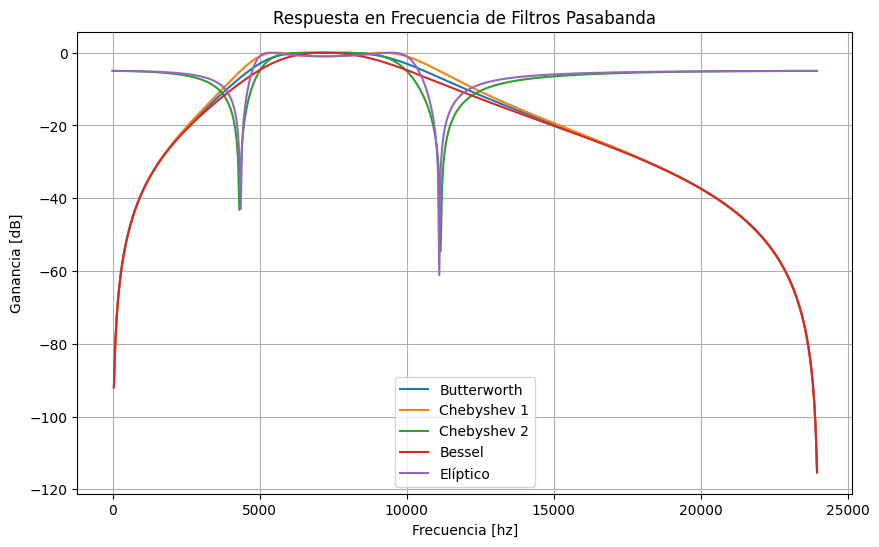

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.signal import lfilter, filtfilt
# Parámetros de diseño del filtro
f_sampling = fs
f_corte_bajo = int(input("Ingrese la frecuencia de corte baja del pasabanda recuerde que la fs de de 48000")) # Frecuencia de corte baja del filtro pasabanda
f_corte_alto = int(input("Ingrese la frecuencia de corte alta del pasabanda recuerde que la fs de de 48000"))  # Frecuencia de corte alta del filtro pasabanda
orden = int(input("Ingrese el orden del filtro"))# Orden del filtro

# Diseñar filtros pasabanda para cada tipo
butter_b, butter_a = signal.butter(orden, [f_corte_bajo, f_corte_alto], btype='bandpass', fs=f_sampling)
cheby1_b, cheby1_a = signal.cheby1(orden, 1, [f_corte_bajo, f_corte_alto], btype='bandpass', fs=f_sampling)
cheby2_b, cheby2_a = signal.cheby2(orden, 5, [f_corte_bajo, f_corte_alto], btype='bandpass', fs=f_sampling)
bessel_b, bessel_a = signal.bessel(orden, [f_corte_bajo, f_corte_alto], btype='bandpass', fs=f_sampling)
ellip_b, ellip_a = signal.ellip(orden, 1, 5, [f_corte_bajo, f_corte_alto], btype='bandpass', fs=f_sampling)

# Respuesta en frecuencia de los filtros
freq, butter_response = signal.freqz(butter_b, butter_a)
_, cheby1_response = signal.freqz(cheby1_b, cheby1_a)
_, cheby2_response = signal.freqz(cheby2_b, cheby2_a)
_, bessel_response = signal.freqz(bessel_b, bessel_a)
_, ellip_response = signal.freqz(ellip_b, ellip_a)
frehz=freq*fs/(2*np.pi)
# Gráficos de respuesta en frecuencia
plt.figure(figsize=(10, 6))
plt.plot(frehz, 20 * np.log10(abs(butter_response)), label='Butterworth')
plt.plot(frehz, 20 * np.log10(abs(cheby1_response)), label='Chebyshev 1')
plt.plot(frehz, 20 * np.log10(abs(cheby2_response)), label='Chebyshev 2')
plt.plot(frehz, 20 * np.log10(abs(bessel_response)), label='Bessel')
plt.plot(frehz, 20 * np.log10(abs(ellip_response)), label='Elíptico')
plt.title('Respuesta en Frecuencia de Filtros Pasabanda')
plt.xlabel('Frecuencia [hz]')
plt.ylabel('Ganancia [dB]')
plt.legend()
plt.grid()
plt.show()


In [10]:
## Filtro Butterworth
sd= filtfilt(butter_b, butter_a,x,axis=0)
Audio(sd[int(fs*ti):int(fs*tf),:].T,rate=fs)

In [11]:
## Filtro Chebyshev 1
ds= filtfilt(cheby1_b, cheby1_a,x,axis=0)
Audio(ds[int(fs*ti):int(fs*tf),:].T,rate=fs)

In [12]:
## Filtro Chebyshev 2
ks= filtfilt(cheby2_b, cheby2_a,x,axis=0)
Audio(ks[int(fs*ti):int(fs*tf),:].T,rate=fs)

In [13]:
## Filtro Bessel
sk= filtfilt(cheby2_b, cheby2_a,x,axis=0)
Audio(sk[int(fs*ti):int(fs*tf),:].T,rate=fs)

In [14]:
dk= filtfilt(cheby2_b, cheby2_a,x,axis=0)
Audio(dk[int(fs*ti):int(fs*tf),:].T,rate=fs)

Consulte en qué consiste el método de diseño de filtros FIR por ventaneo (Ver función firwin y material de apoyo). Realice un cuadro comparativo de las ventajas y desventajas de los filtros IIR y los FIR. Nota: Recuerde que un filtro FIR utiliza solamente raíces tipo ceros, es decir que  a0=1 , y  ak=0   ∀k∈{1,2,…} .

Ventajas:

-Eficiencia en la implementación: Generalmente requieren menos coeficientes que los filtros FIR para obtener una respuesta similar.

-Facilidad de diseño: Algunos tipos de filtros IIR, como Butterworth, son más fáciles de diseñar con especificaciones sencillas.

Desventajas:

-Estabilidad: Pueden ser menos estables que los filtros FIR, especialmente si el orden es alto o si se utilizan estructuras de filtrado complejas.

-No linealidad de fase: Suelen presentar distorsiones de fase en la banda de paso, lo que puede ser crítico en ciertas aplicaciones como el procesamiento de señales de audio.

Filtros FIR (Finite Impulse Response):

*Ventajas: *

-Estabilidad: Son inherentemente estables debido a su respuesta finita al impulso.

-Linealidad de fase: Presentan una respuesta de fase lineal, lo que los hace útiles en aplicaciones donde se requiere una respuesta en fase precisa. Flexibilidad en el diseño: Permiten un control preciso sobre la respuesta en frecuencia mediante la elección de la ventana y los parámetros de diseño.

Desventajas:

-Mayor orden: Suelen requerir un orden mayor en comparación con los filtros IIR para obtener una respuesta similar, lo que puede aumentar la complejidad computacional.

-Mayor retardo: Tienen un retardo inherente mayor debido a su naturaleza de respuesta finita al impulso. Mayor sensibilidad a errores de coeficientes: Pequeños errores en los coeficientes pueden tener un impacto significativo en la respuesta del filtro.